## Import libraries 

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pickle  
import plotly.express as px
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,confusion_matrix ,classification_report,ConfusionMatrixDisplay  
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import GridSearchCV


import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

## Loading the dataset

In [21]:
file_path = "date_modified.csv"
df = pd.read_csv(file_path)
df

,Booking_ID,number of adults,number of children,number of weekend nights,number of week nights,type of meal,car parking space,room type,lead time,market segment type,repeated,P-C,P-not-C,average price,special requests,date of reservation,booking status
0,INN00001,1,1,2,5,Meal Plan 1,0,Room_Type 1,224,Offline,0,0,0,88.00,0,10/2/2015,Not_Canceled
1,INN00002,1,0,1,3,Not Selected,0,Room_Type 1,5,Online,0,0,0,106.68,1,11/6/2018,Not_Canceled
2,INN00003,2,1,1,3,Meal Plan 1,0,Room_Type 1,1,Online,0,0,0,50.00,0,2/28/2018,Canceled
3,INN00004,1,0,0,2,Meal Plan 1,0,Room_Type 1,211,Online,0,0,0,100.00,1,5/20/2017,Canceled
4,INN00005,1,0,1,2,Not Selected,0,Room_Type 1,48,Online,0,0,0,77.00,0,4/11/2018,Canceled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36280,INN36282,2,0,0,2,Meal Plan 2,0,Room_Type 1,346,Online,0,0,0,115.00,1,9/13/2018,Canceled
36281,INN36283,2,0,1,3,Meal Plan 1,0,Room_Type 1,34,Online,0,0,0,107.55,1,10/15/2017,Not_Canceled
36282,INN36284,2,0,1,3,Meal Plan 1,0,Room_Type 4,83,Online,0,0,0,105.61,1,12/26/2018,Not_Canceled
36283,INN36285,3,0,0,4,Meal Plan 1,0,Room_Type 1,121,Offline,0,0,0,96.90,1,7/6/2018,Not_Canceled


In [22]:
# Filter numeric columns
numeric_df = df.select_dtypes(include=['number'])

# Reshape the DataFrame for Plotly
melted_df = numeric_df.melt(var_name='Features', value_name='Values')

# Create the box plot
fig = px.box(melted_df, x='Features', y='Values', title="Box Plot of Numeric Features")

# Show the figure
fig.show()

##  Identifying the structure of the dataset, including the number of columns, data types, and missing values

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36285 entries, 0 to 36284
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Booking_ID                36285 non-null  object 
 1   number of adults          36285 non-null  int64  
 2   number of children        36285 non-null  int64  
 3   number of weekend nights  36285 non-null  int64  
 4   number of week nights     36285 non-null  int64  
 5   type of meal              36285 non-null  object 
 6   car parking space         36285 non-null  int64  
 7   room type                 36285 non-null  object 
 8   lead time                 36285 non-null  int64  
 9   market segment type       36285 non-null  object 
 10  repeated                  36285 non-null  int64  
 11  P-C                       36285 non-null  int64  
 12  P-not-C                   36285 non-null  int64  
 13  average price             36285 non-null  float64
 14  specia

In [24]:
# Print unique values for each column
unique_values = df.apply(lambda x: x.unique())
print(unique_values)

Booking_ID                  [INN00001, INN00002, INN00003, INN00004, INN00...
number of adults                                              [1, 2, 3, 0, 4]
number of children                                        [1, 0, 2, 3, 10, 9]
number of weekend nights                             [2, 1, 0, 4, 3, 6, 5, 7]
number of week nights       [5, 3, 2, 4, 0, 1, 10, 6, 11, 7, 15, 9, 13, 8,...
type of meal                [Meal Plan 1, Not Selected, Meal Plan 2, Meal ...
car parking space                                                      [0, 1]
room type                   [Room_Type 1, Room_Type 4, Room_Type 2, Room_T...
lead time                   [224, 5, 1, 211, 48, 346, 34, 83, 121, 44, 0, ...
market segment type         [Offline, Online, Corporate, Aviation, Complem...
repeated                                                               [0, 1]
P-C                                             [0, 3, 1, 2, 11, 4, 5, 13, 6]
P-not-C                     [0, 5, 1, 3, 4, 12, 19, 2, 15, 17, 7

## Data Preprocessing

In [25]:
# print columns names
df.columns = df.columns.str.replace(' ', '_').str.lower()
df.columns

Index(['booking_id', 'number_of_adults', 'number_of_children',
       'number_of_weekend_nights', 'number_of_week_nights', 'type_of_meal',
       'car_parking_space', 'room_type', 'lead_time', 'market_segment_type',
       'repeated', 'p-c', 'p-not-c', 'average_price_', 'special_requests',
       'date_of_reservation', 'booking_status'],
      dtype='object')

In [26]:
# convert the date to time stamp instead of string
df['date_of_reservation'] = pd.to_datetime(df['date_of_reservation'])
# sort the dataset according to date
df = df.sort_values(by='date_of_reservation', ascending=True)
df

,booking_id,number_of_adults,number_of_children,number_of_weekend_nights,number_of_week_nights,type_of_meal,car_parking_space,room_type,lead_time,market_segment_type,repeated,p-c,p-not-c,average_price_,special_requests,date_of_reservation,booking_status
0,INN00001,1,1,2,5,Meal Plan 1,0,Room_Type 1,224,Offline,0,0,0,88.0,0,2015-10-02,Not_Canceled
5,INN00006,1,0,0,2,Meal Plan 2,0,Room_Type 1,346,Offline,0,0,0,100.0,1,2016-09-13,Canceled
3,INN00004,1,0,0,2,Meal Plan 1,0,Room_Type 1,211,Online,0,0,0,100.0,1,2017-05-20,Canceled
27966,INN27967,1,0,0,2,Meal Plan 2,0,Room_Type 1,257,Offline,0,0,0,80.0,0,2017-07-01,Not_Canceled
27942,INN27943,1,0,0,2,Meal Plan 2,0,Room_Type 1,257,Offline,0,0,0,80.0,0,2017-07-01,Not_Canceled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32027,INN32028,2,2,0,1,Meal Plan 1,0,Room_Type 6,260,Online,0,0,0,168.3,0,2018-12-31,Not_Canceled
13466,INN13467,2,0,1,1,Not Selected,0,Room_Type 1,18,Online,0,0,0,129.0,1,2018-12-31,Not_Canceled
13460,INN13461,2,0,2,2,Meal Plan 1,0,Room_Type 1,19,Online,0,0,0,110.5,0,2018-12-31,Not_Canceled
28291,INN28292,2,0,1,1,Meal Plan 1,0,Room_Type 4,18,Online,0,0,0,148.0,1,2018-12-31,Not_Canceled


In [27]:
# check if there is null values
df.isnull().sum()

booking_id                  0
number_of_adults            0
number_of_children          0
number_of_weekend_nights    0
number_of_week_nights       0
type_of_meal                0
car_parking_space           0
room_type                   0
lead_time                   0
market_segment_type         0
repeated                    0
p-c                         0
p-not-c                     0
average_price_              0
special_requests            0
date_of_reservation         0
booking_status              0
dtype: int64

In [28]:
duplicates = df.duplicated().sum()
duplicates

0

In [29]:
# drop raws with null average price
df = df.loc[df['average_price_'] != 0].reset_index(drop=True)

## EDA

In [30]:
# knowing how many canceled bookings and not canceled one

# decode the catagorical into numerical values
df['booking_status'] = df['booking_status'].replace({'Not_Canceled': 0, 'Canceled': 1})
not_canceled = df.loc[ df["booking_status"] == 0] 
canceled= df.loc[ df["booking_status"] == 1] 

# calculate the count of each category
not_canceled_count = len(not_canceled)
canceled_count = len(canceled)

# create a dataframe with the counts
counts = pd.DataFrame({'Booking Status': ['Not Canceled', 'Canceled'], 
                       'Count': [not_canceled_count, canceled_count]})

# plot the results
fig = px.pie(counts, names='Booking Status', values='Count', title=f'Proportion of Canceled and Not Canceled Bookings (Canceled: {canceled_count}, Not Canceled: {not_canceled_count})')
fig.show()


In [31]:
px.box(data_frame= df ,x = 'room_type', y = 'average_price_',color='booking_status')

In [32]:
nights=df.copy()
nights['total_nights'] = df['number_of_weekend_nights'] + df['number_of_week_nights']


In [33]:
fig = px.histogram(nights, x="total_nights", color="booking_status", 
                   nbins=50, title="Distribution of Total Nights by Booking Status")
fig.show()

In [34]:
df.columns

Index(['booking_id', 'number_of_adults', 'number_of_children',
       'number_of_weekend_nights', 'number_of_week_nights', 'type_of_meal',
       'car_parking_space', 'room_type', 'lead_time', 'market_segment_type',
       'repeated', 'p-c', 'p-not-c', 'average_price_', 'special_requests',
       'date_of_reservation', 'booking_status'],
      dtype='object')

In [35]:
date=pd.DataFrame()
date['year'] = pd.DatetimeIndex(df['date_of_reservation']).year
date['month'] = pd.DatetimeIndex(df['date_of_reservation']).month
date['day'] = pd.DatetimeIndex(df['date_of_reservation']).day
df = pd.concat([df, date], axis=1)

date

,year,month,day
0,2015,10,2
1,2016,9,13
2,2017,5,20
3,2017,7,1
4,2017,7,1
...,...,...,...
35735,2018,12,31
35736,2018,12,31
35737,2018,12,31
35738,2018,12,31


In [36]:
# Calculate total number of bookings acorss different years 
year_counts = date['year'].value_counts().sort_index()
year_counts

year
2015        1
2016        1
2017     6283
2018    29455
Name: count, dtype: int64

In [37]:
# Filter the data to include only bookings from 2018
year_2018 = date[date['year'] == 2018]

# Calculate the total number of bookings by month for 2018
month_counts_2018 = year_2018['month'].value_counts().sort_index()

# Create a bar chart
fig = px.line(x=month_counts_2018.index, y=month_counts_2018.values)
fig.update_layout(title='Total Bookings by Month in 2018',
                  xaxis_title='Month',
                  yaxis_title='Total Bookings')
fig.show()

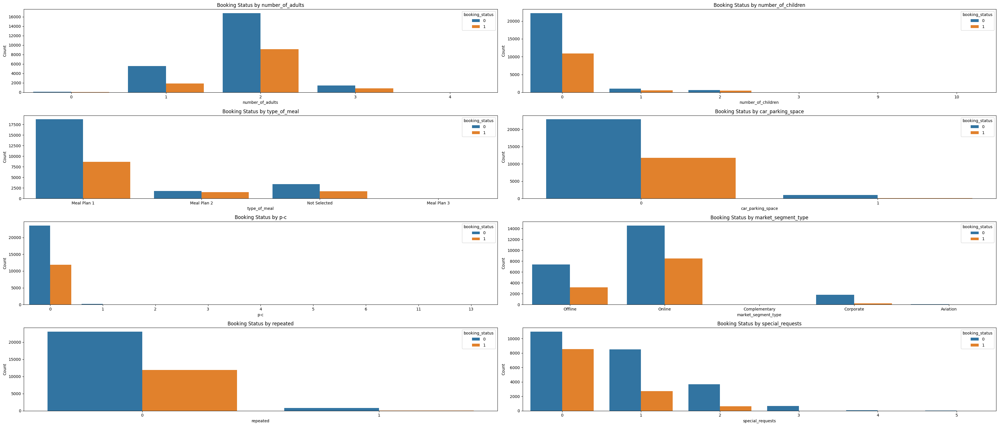

In [38]:
# knowing the booking status for each column 
# Create a figure with subplots for each column
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(35, 15))

# Iterate through each column and create a bar chart
columns = ['number_of_adults', 'number_of_children', 'type_of_meal', 'car_parking_space','p-c' ,
            'market_segment_type', 'repeated', 'special_requests']

for i, col in enumerate(columns):
    ax = axs[i // 2, i % 2]
    sns.countplot(x=col, hue='booking_status', data=df, ax=ax)
    ax.set_title(f'Booking Status by {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Count')

plt.tight_layout()
plt.show()

## Removing outliers by normalizing Average Prices

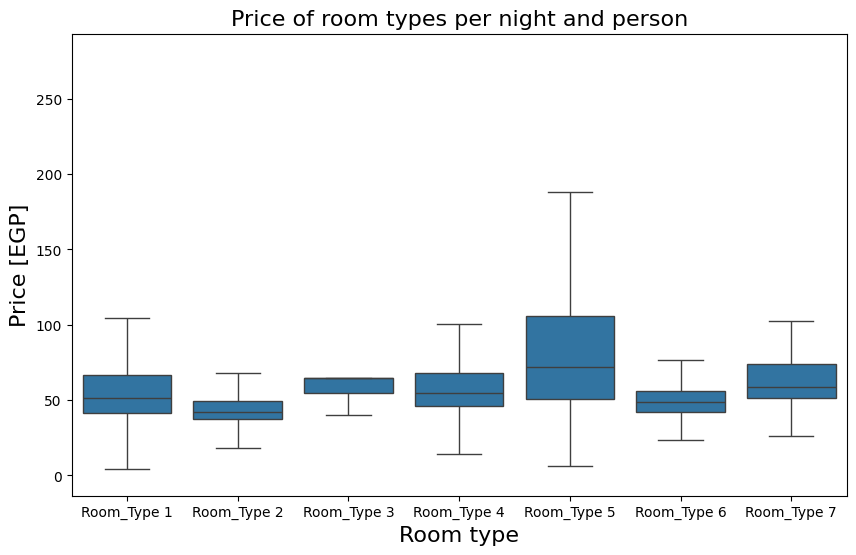

In [39]:
# outliers removal by normalization the average price
# normalize price per night :
norm_price=[]
norm_price = df["average_price_"] / (df["number_of_adults"] + df["number_of_children"])
df.insert(len(df.columns)-1, 'norm_price', norm_price)  # Insert before the last column
df.drop('average_price_',axis=1,inplace=True)
room_prices = df[[ "room_type", "norm_price"]].sort_values("room_type")

# boxplot:
plt.figure(figsize=(10, 6))
sns.boxplot(x="room_type",
            y="norm_price",
            data=room_prices, 
            fliersize=0)
plt.title("Price of room types per night and person", fontsize=16)
plt.xlabel("Room type", fontsize=16)
plt.ylabel("Price [EGP]", fontsize=16)
plt.show()


### remove outliers of Lead time using z-score

In [40]:
# to see outliers clearly
fig = px.box(df, y='lead_time')
fig.show()

In [41]:
# Calculate z-scores for lead time
df['z_score'] = stats.zscore(df['lead_time'])

# Filter outliers (threshold = 3)
df= df[abs(df['z_score']) < 1.5]

# to see outliers clearly
fig = px.box(df, y='lead_time')
fig.show()

In [42]:
df.drop(['z_score','booking_id','date_of_reservation','year'] ,axis='columns', inplace=True)
df.reset_index(drop=True, inplace=True)

In [43]:
df.drop(['p-c','p-not-c'] ,axis='columns', inplace=True)
df.reset_index(drop=True, inplace=True)

In [44]:
duplicates = df.duplicated().sum()
duplicates

7845

In [45]:
df.drop_duplicates(inplace=True)
duplicates = df.duplicated().sum()
duplicates

0

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24384 entries, 0 to 32228
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   number_of_adults          24384 non-null  int64  
 1   number_of_children        24384 non-null  int64  
 2   number_of_weekend_nights  24384 non-null  int64  
 3   number_of_week_nights     24384 non-null  int64  
 4   type_of_meal              24384 non-null  object 
 5   car_parking_space         24384 non-null  int64  
 6   room_type                 24384 non-null  object 
 7   lead_time                 24384 non-null  int64  
 8   market_segment_type       24384 non-null  object 
 9   repeated                  24384 non-null  int64  
 10  special_requests          24384 non-null  int64  
 11  booking_status            24384 non-null  int64  
 12  month                     24384 non-null  int32  
 13  norm_price                24384 non-null  float64
 14  day        

## Encoding

In [47]:
# Create one-hot encoding using crosstab
meal_type = pd.crosstab(index=df.index, columns=df['type_of_meal'])
# Concatenate with original DataFrame if needed
df = pd.concat([df, meal_type], axis=1)
# Create one-hot encoding using crosstab
market_segment = pd.crosstab(index=df.index, columns=df['market_segment_type'])
# Concatenate with original DataFrame if needed
df = pd.concat([df, market_segment], axis=1)
# Create one-hot encoding using crosstab
room = pd.crosstab(index=df.index, columns=df['room_type'])
# Concatenate with original DataFrame if needed
df = pd.concat([df, room], axis=1)
df.drop(['type_of_meal','market_segment_type','room_type'],axis=1,inplace=True)


In [48]:
df

,number_of_adults,number_of_children,number_of_weekend_nights,number_of_week_nights,car_parking_space,lead_time,repeated,special_requests,booking_status,month,...,Corporate,Offline,Online,Room_Type 1,Room_Type 2,Room_Type 3,Room_Type 4,Room_Type 5,Room_Type 6,Room_Type 7
0,1,0,0,2,0,211,0,1,1,5,...,0,0,1,1,0,0,0,0,0,0
1,2,0,1,4,0,181,0,0,1,7,...,0,0,1,1,0,0,0,0,0,0
2,3,0,1,4,0,181,0,0,1,7,...,0,0,1,1,0,0,0,0,0,0
3,2,0,2,4,0,92,0,2,0,7,...,0,0,1,1,0,0,0,0,0,0
4,2,0,0,4,0,88,0,1,1,7,...,0,0,1,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32223,2,0,0,1,0,17,0,0,0,12,...,0,1,0,1,0,0,0,0,0,0
32224,2,0,2,2,0,40,0,0,1,12,...,0,0,1,1,0,0,0,0,0,0
32226,2,0,2,2,0,19,0,0,0,12,...,0,0,1,1,0,0,0,0,0,0
32227,2,0,1,1,0,18,0,1,0,12,...,0,0,1,0,0,0,1,0,0,0


## Scaling

In [49]:

# Initialize the scaler
min_max_scaler = MinMaxScaler()

# Apply Min-Max Scaling
df['number_of_adults'] = min_max_scaler.fit_transform(df[['number_of_adults']])
df['number_of_children'] = min_max_scaler.fit_transform(df[['number_of_children']])
df['number_of_weekend_nights'] = min_max_scaler.fit_transform(df[['number_of_weekend_nights']])
df['number_of_week_nights'] = min_max_scaler.fit_transform(df[['number_of_week_nights']])
df['lead_time'] = min_max_scaler.fit_transform(df[['lead_time']])
df['special_requests'] = min_max_scaler.fit_transform(df[['special_requests']])
df['norm_price'] = min_max_scaler.fit_transform(df[['norm_price']])
df['month'] = min_max_scaler.fit_transform(df[['month']])
df['day'] = min_max_scaler.fit_transform(df[['day']])


## Balancing the Dataset

In [50]:
#!pip install imblearn

X = df.drop('booking_status', axis=1)
y = df['booking_status']

smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X, y)

# Convert back to DataFrame if needed
df_resampled = pd.DataFrame(X_resampled, columns=X.columns)
df_resampled['booking_status'] = y_resampled


In [51]:
#df_resampled.info # plot the results
fig = px.pie(df_resampled, names='booking_status')
fig.show()

## Feature Selection

### Use mutual information gain

In [52]:
X=df_resampled.drop('booking_status',axis=1)
Y=df_resampled['booking_status']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

In [53]:
# determine the mutual information
mutual_info = mutual_info_classif(X_train, y_train)
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending=False)

lead_time                   0.297062
day                         0.212660
number_of_week_nights       0.170053
month                       0.149405
norm_price                  0.131543
special_requests            0.075465
number_of_weekend_nights    0.064757
Online                      0.036004
number_of_children          0.022685
Offline                     0.020231
number_of_adults            0.016124
repeated                    0.013155
Room_Type 1                 0.011922
Corporate                   0.010059
car_parking_space           0.006470
Complementary               0.003604
Aviation                    0.003101
Meal Plan 2                 0.003039
Room_Type 2                 0.001900
Meal Plan 3                 0.001033
Room_Type 6                 0.000706
Room_Type 5                 0.000503
Not Selected                0.000000
Meal Plan 1                 0.000000
Room_Type 3                 0.000000
Room_Type 4                 0.000000
Room_Type 7                 0.000000
d

<Axes: >

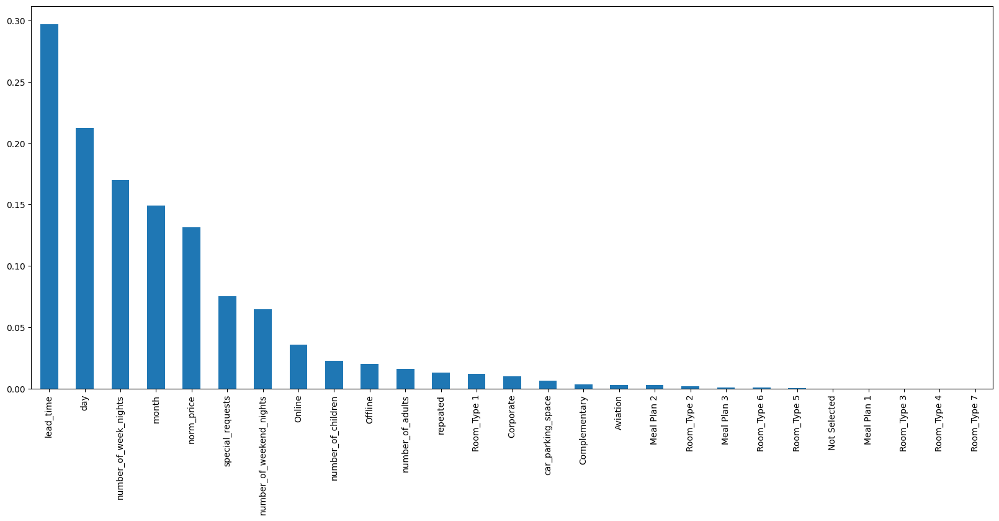

In [54]:
#plot the ordered mutual_info values per feature
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8))

In [55]:
mutual_info = mutual_info_classif(X_train, y_train)

# Create a Series for mutual information with feature names
mutual_info_series = pd.Series(mutual_info, index=X_train.columns)

# Sort the series to find the top features
top_features = mutual_info_series.sort_values(ascending=False).head(16)
#print("Top 16 features based on mutual information:")
#print(top_features)

# Selecting the top 10 features from the training and test sets
X_train_selected = X_train[top_features.index]
X_test_selected = X_test[top_features.index]

In [56]:
top_features

lead_time                   0.298723
day                         0.216709
number_of_week_nights       0.170342
month                       0.147879
norm_price                  0.128981
special_requests            0.077044
number_of_weekend_nights    0.061328
Online                      0.043381
Offline                     0.028228
number_of_children          0.024869
number_of_adults            0.019557
repeated                    0.012184
Room_Type 1                 0.009570
Meal Plan 1                 0.005584
Corporate                   0.005392
car_parking_space           0.005371
dtype: float64

### Model

In [57]:
# Random Forest Classifier
model = RandomForestClassifier(random_state=42)
model.fit(X_train_selected, y_train)

# Making predictions
y_pred = model.predict(X_test_selected)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy of the model using top 16 features: {accuracy:.2f}')

Accuracy of the model using top 16 features: 0.89


In [70]:
# Random Forest Classifier
model = RandomForestClassifier(random_state=42,max_depth=30,n_estimators=155)
model.fit(X_train_selected, y_train)

# Making predictions
y_pred = model.predict(X_test_selected)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy of the model using top 16 features: {accuracy:.2f}')

Accuracy of the model using top 16 features: 0.89


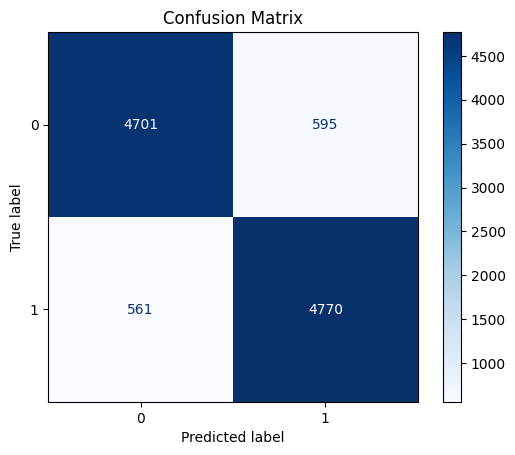

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.89      0.89      5296
           1       0.89      0.89      0.89      5331

    accuracy                           0.89     10627
   macro avg       0.89      0.89      0.89     10627
weighted avg       0.89      0.89      0.89     10627



In [58]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)

# Plot the confusion matrix
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

# Print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)


In [63]:
# Decision Tree Classifier
DT = DecisionTreeClassifier(criterion= 'gini',max_depth=8,random_state=0) 
DT.fit(X_train_selected, y_train)
DT_pred = DT.predict(X_test_selected)
DT_acc = accuracy_score(y_test, DT_pred)
print(f'Accuracy of the model using top 16 features: {DT_acc:.2f}')

Accuracy of the model using top 16 features: 0.82


In [72]:
# Grid Search
# Set up the parameter grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 8, 10, 15,20,25],
    'min_samples_split': [2, 5, 10,15],
    'min_samples_leaf': [1, 2, 4,6]
}
grid_search = GridSearchCV(estimator=DT, param_grid=param_grid,scoring='accuracy',cv=5,n_jobs=1,verbose=1)
grid_search.fit(X_train_selected, y_train)

print(f'Best Parameters: {grid_search.best_params_}')
print(f'Best Score: {grid_search.best_score_}')


Fitting 5 folds for each of 224 candidates, totalling 1120 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 6, 'min_samples_split': 2}
Best Score: 0.8365396249243799


In [77]:
# Grid Search
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
    }

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5,verbose=3)
grid_search.fit(X_train_selected, y_train)


# Get the best parameters and score
best_params_rf = grid_search.best_params_
best_score_rf = grid_search.best_score_

print(f'Best parameters: {best_params_rf}')
print(f'Best cross-validated accuracy: {best_score_rf:.2f}')


Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV 1/5] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=50;, score=0.840 total time=   1.1s
[CV 2/5] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=50;, score=0.834 total time=   1.1s
[CV 3/5] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=50;, score=0.836 total time=   1.1s
[CV 4/5] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=50;, score=0.847 total time=   1.0s
[CV 5/5] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=50;, score=0.834 total time=   1.1s
[CV 1/5] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.842 total time=   2.2s
[CV 2/5] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.836 total time=   2.2s
[CV 3/5] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.836 total time=   2.3s

In [546]:
# Save the model using pickle
with open('model.pkl', 'wb') as model_file:
    pickle.dump(model, model_file)

print("Model saved successfully.")

Model saved successfully.


In [5]:

with open('model.pkl', 'rb') as model_file:
    loaded_model = pickle.load(model_file)

# Now you can use loaded_model to make predictions


In [19]:
loaded_model.predict([[100,10,20,100,10,0,1,1,1,0,10,0,0,1,0,0]])

c:\Python\Python310\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array([0], dtype=int64)